# 6. Horizontal Data
## Dimensionality Reduction on thicknesses
We consider here the thickness data. We stack the data horizontally, i.e. `X_OCT` has shape $(14\cdot 18 \cdot 5, 768)$. We attribute the labels with respect to the type of patient: AMD or control. We see if we can observe any separation in dimensionality reduction.

Use environment `cloned_CNN2`.

Table of contents: 
- 6.1: TSNE
    - 6.1.1: TSNE with different parameters
- 6.2: UMAP
    - 6.2.1: UMAP with different parameters
- 6.3: Layer-labeled horizontal data
    - 6.3.1: TSNE with layer labels
    - 6.3.2: UMAP with layer labels
- 6.4 Dim. Red. on single layers
    - 6.4.1: TSNE on single layers
    - 6.4.2: UMAP on single layers

In [1]:
import sys
import os
from skimage import exposure
import pandas as pd 
import numpy as np 
import cv2
import glob
from helpers import *
import matplotlib.pyplot as plt
from buildDataset import *
from warnings import warn
from sklearn.decomposition import PCA, KernelPCA, NMF
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold
from sklearn.naive_bayes import GaussianNB
from sklearn.utils import shuffle
import umap

../../2_Preprocessing_Code/amd/prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
X,y = getBalancedXYData(mode = 'thickness',normmode = 'EQ-hist')
print(X.shape)
print(y.shape)
print(768*14*18)

(193536, 5)
(193536,)
193536


In [3]:
# X_OCT: (W, N x patients x H) 
# y_labels: 1 if AMD, 0 if control.
X_OCT = X.reshape((768,14*18*X.shape[1])).T
y_labels = np.zeros((14*18*X.shape[1]))

# true labels are for the third patient
# each patient has 14 OCT scans
# each scan has 5 rows.
for i in range(28*X.shape[1], (28+14)*X.shape[1]):
    y_labels[i::(42*X.shape[1])] = 1

with np.printoptions(threshold=np.inf):
    print(y_labels)
print("Do we have the right number of True labels? Answer:",y_labels.sum()==14*5*6)
print("X_OCT shape:", X_OCT.shape)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

In [4]:
# down sample (to have balanced classes) and shuffle the indices: 
print("nbr true labels:", (y_labels).sum())
print("nbr false labels:", (1-y_labels).sum())
X_down, y_down = downsample(X_OCT,y_labels)
X_shuffle, y_shuffle = shuffle(X_down, y_down, random_state=0)
print("nbr true labels:", (y_shuffle).sum())
print("nbr false labels:", (1-y_shuffle).sum())

nbr true labels: 420.0
nbr false labels: 840.0
nbr true labels: 420.0
nbr false labels: 420.0


## 6.1 TSNE
In 2 dimensions


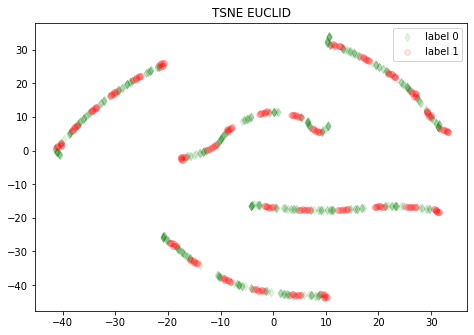

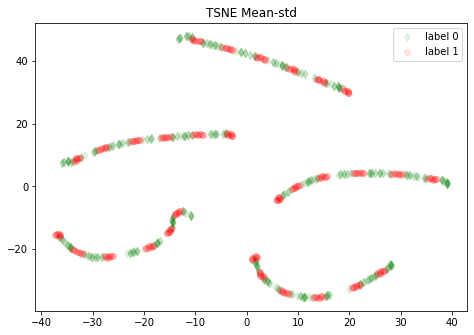

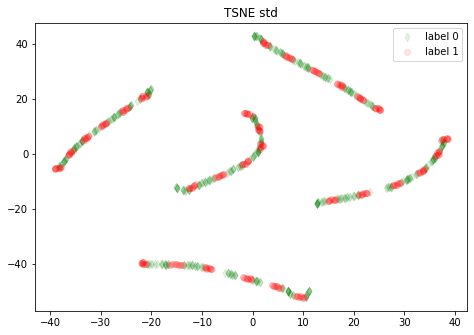

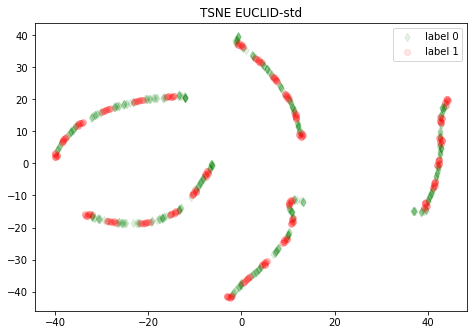

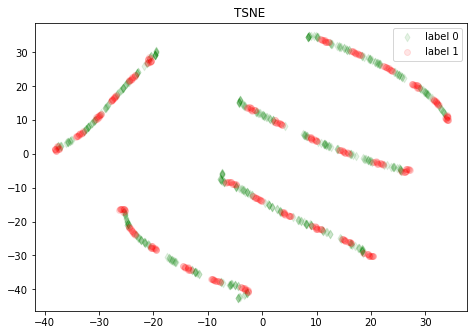

In [19]:
model = TSNE
params = {
    'n_components': 2,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle).astype(bool)
mask1 = np.array(y_shuffle).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('TSNE '+ normmode)
    fig.savefig('figures/HorData/TSNE_'+savefile_normmode[j], bbox_inches='tight')

in 3D

(840, 3)


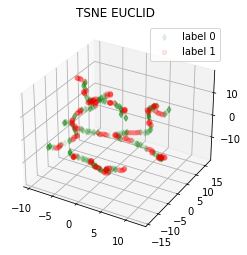

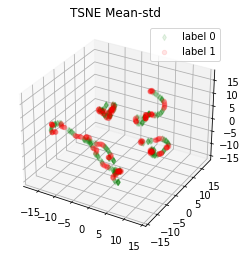

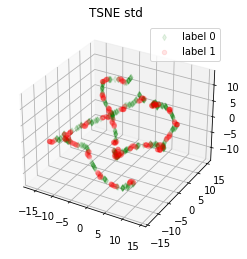

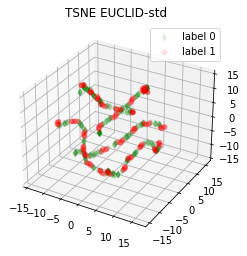

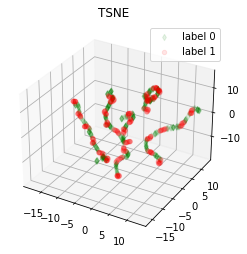

In [20]:
model = TSNE
params = {
    'n_components': 3,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle).astype(bool)
mask1 = np.array(y_shuffle).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(X_t[mask0,0], X_t[mask0,1], X_t[mask0,2], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1], X_t[mask1,2],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('TSNE '+ normmode)
    fig.savefig('figures/HorData/3D_TSNE_'+savefile_normmode[j], bbox_inches='tight')

print(X_t.shape)

## 6.1.1 TSNE with different parameters


c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app


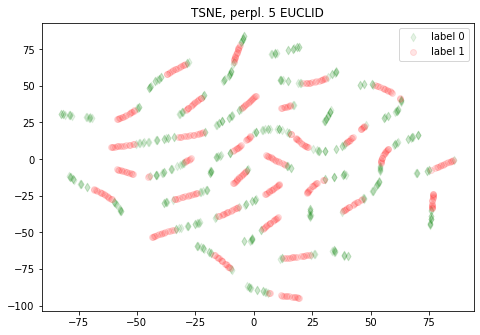

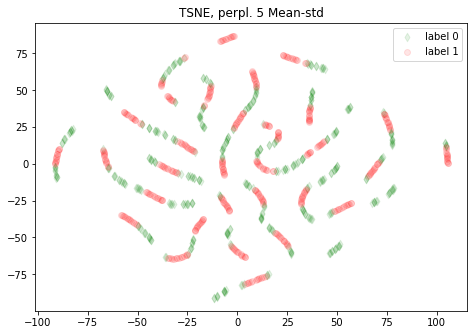

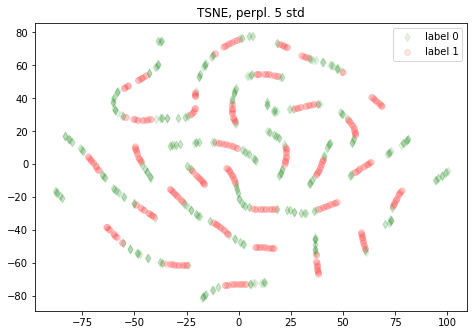

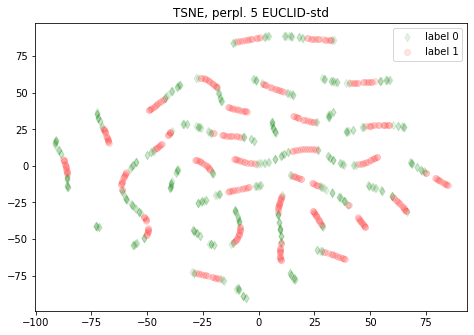

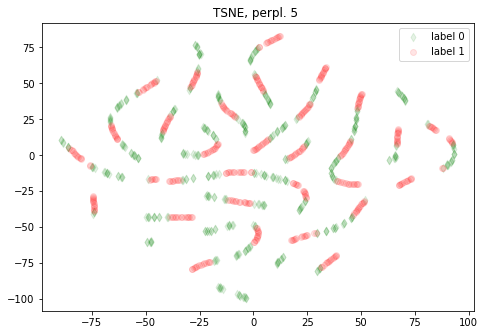

...

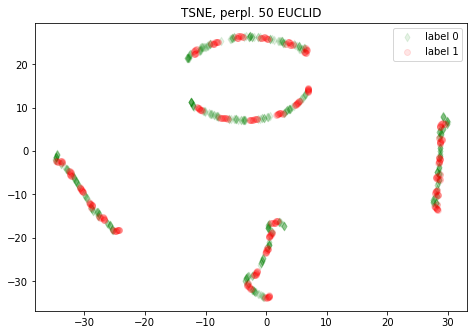

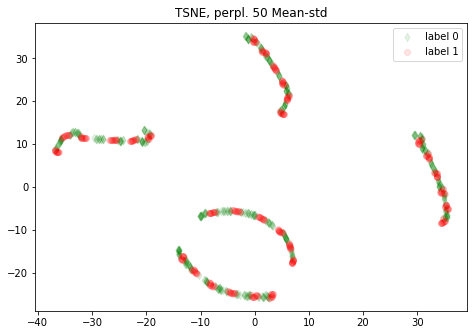

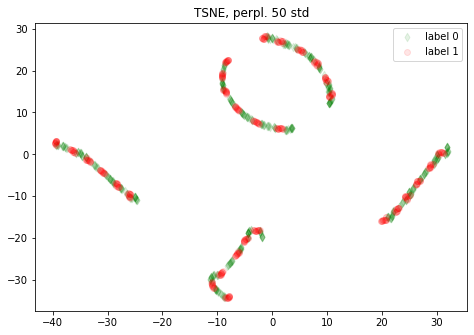

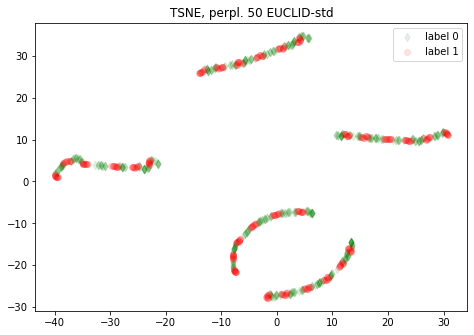

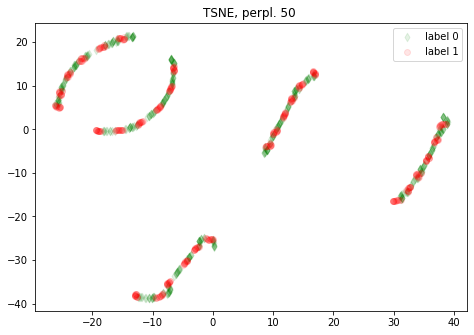

In [12]:
model = TSNE
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
perplexities = np.arange(start=5, stop=55, step=5)

for perplexity in perplexities:
    params = {
        'n_components': 2,
        'learning_rate': 'auto',
        'init': 'random',
        'perplexity': perplexity,
    }
    savefig = 'figures/HorData/TSNE/perplex/perplexity_'+str(perplexity)
    title = 'TSNE, perpl. '+ str(perplexity)
    plot_proj_notraining(X_shuffle, y_shuffle, model, params, dimred_normmode, title, savefig)

## 6.2 U-map
in 2D

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


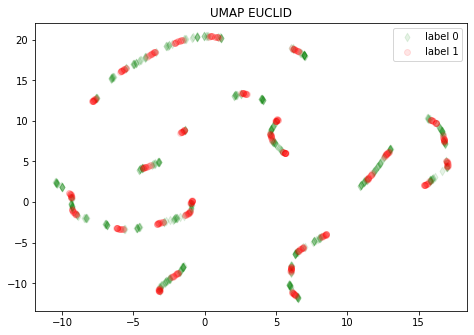

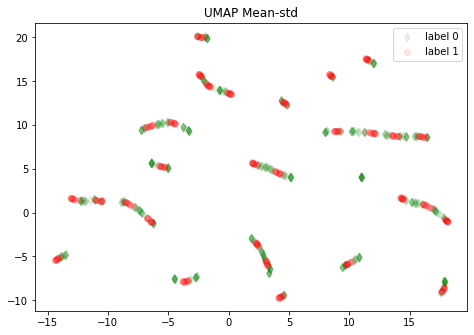

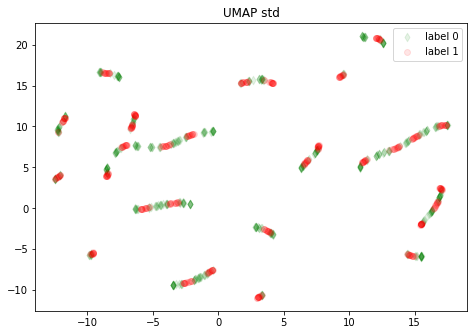

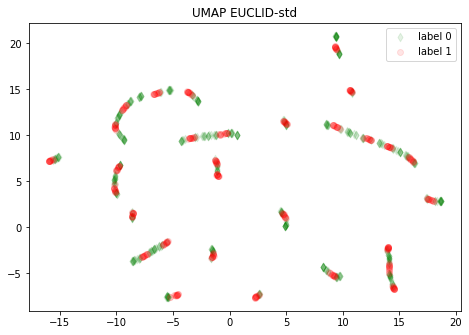

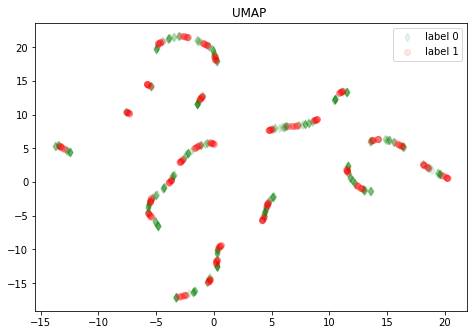

In [21]:
model = umap.UMAP
params = {
    'n_components': 2,
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle).astype(bool)
mask1 = np.array(y_shuffle).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('UMAP '+ normmode)
    fig.savefig('figures/HorData/UMAP_'+savefile_normmode[j], bbox_inches='tight')

3D Umap

(840, 3)


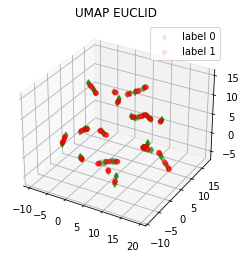

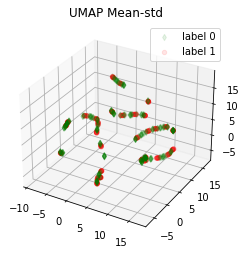

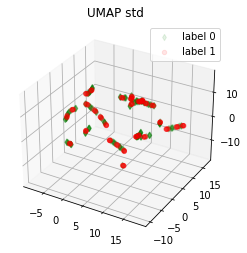

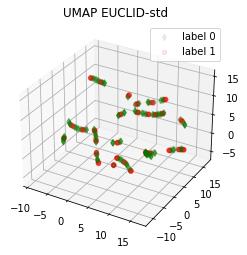

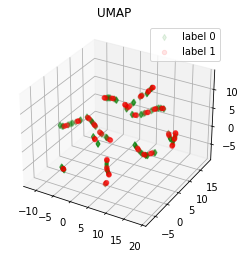

In [22]:
model = umap.UMAP
params = {
    'n_components': 3,
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle).astype(bool)
mask1 = np.array(y_shuffle).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(X_t[mask0,0], X_t[mask0,1], X_t[mask0,2], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1], X_t[mask1,2],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('UMAP '+ normmode)
    fig.savefig('figures/HorData/3D_UMAP_'+savefile_normmode[j], bbox_inches='tight')

print(X_t.shape)

### 6.2.1 UMAP with different number of neighbors
We vary the parameter number of neighbors for the UMAP model.

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Grap

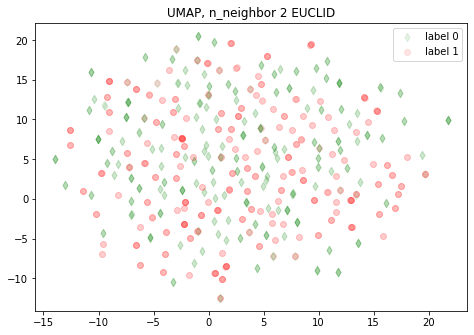

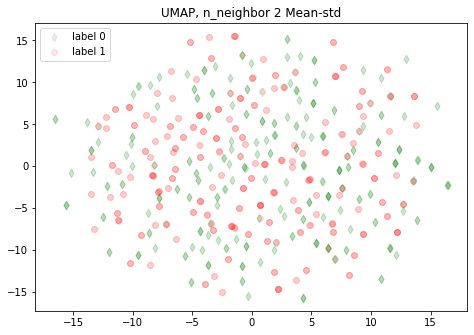

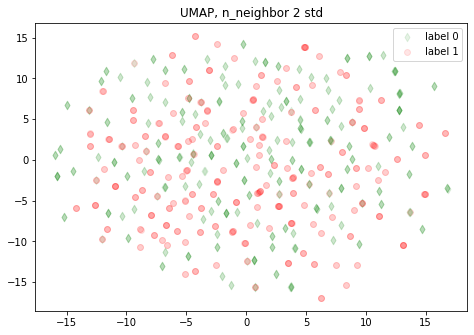

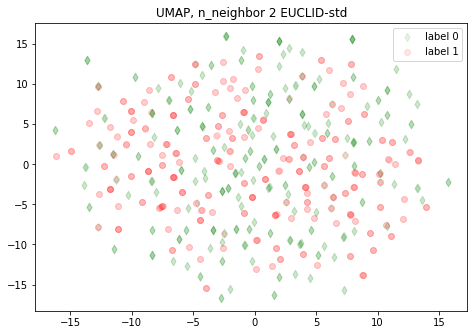

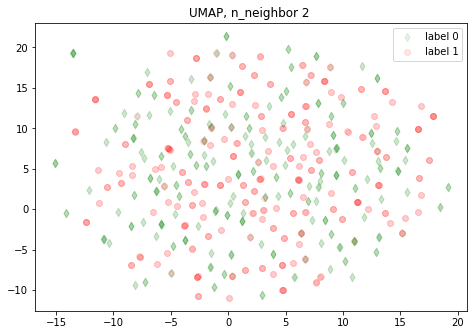

...

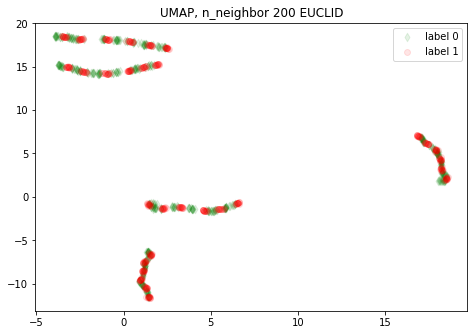

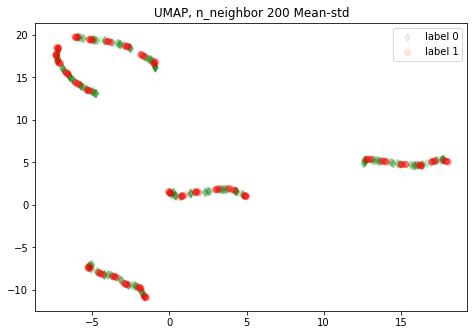

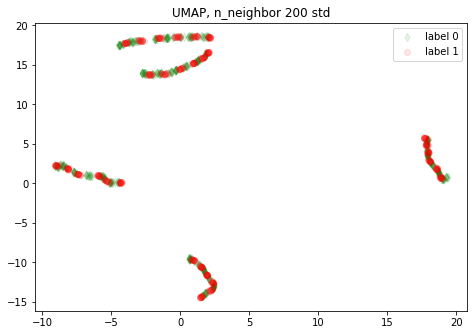

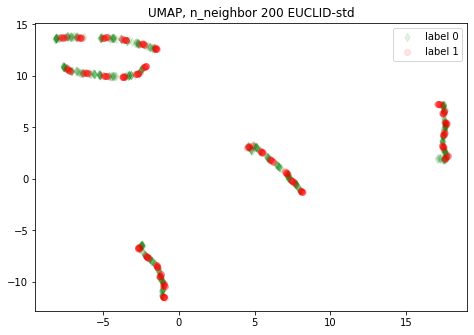

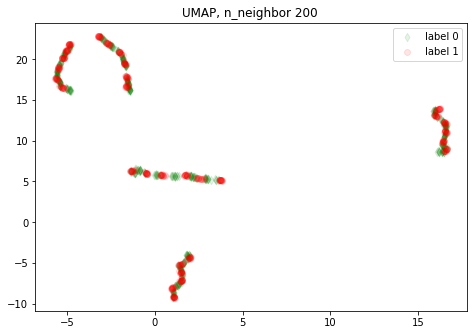

In [5]:
model = umap.UMAP

dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
neighbors = [2, 5, 10, 20, 50, 100, 200]

for n_neighbor in neighbors:
    params = {
        'n_components': 2,
        'n_neighbors': n_neighbor,
    }
    savefig = 'figures/HorData/UMAP/n_neighbor/n_neighbor_'+ str(n_neighbor)
    title = 'UMAP, n_neighbor '+ str(n_neighbor)
    plot_proj_notraining(X_shuffle, y_shuffle, model, params, dimred_normmode, title, savefig)

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Grap

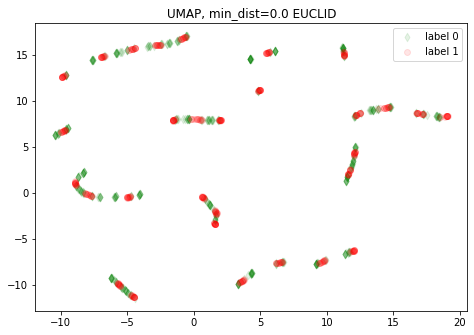

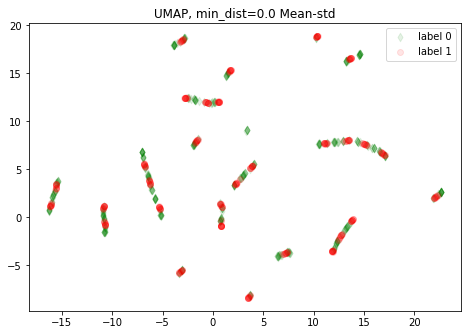

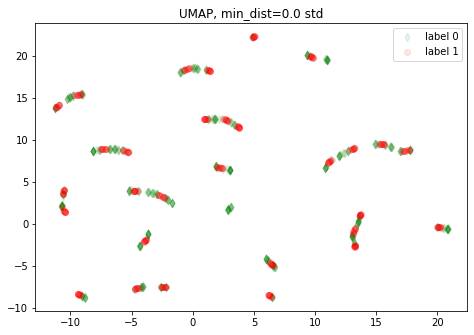

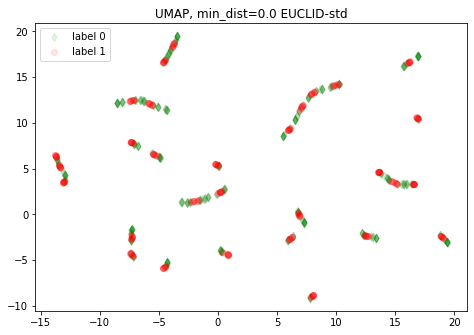

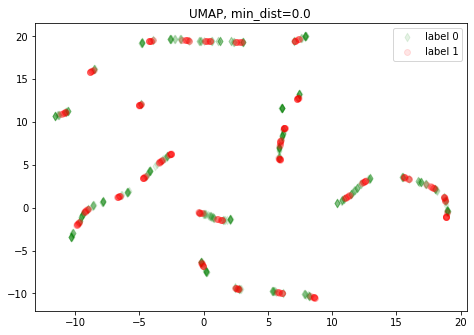

...

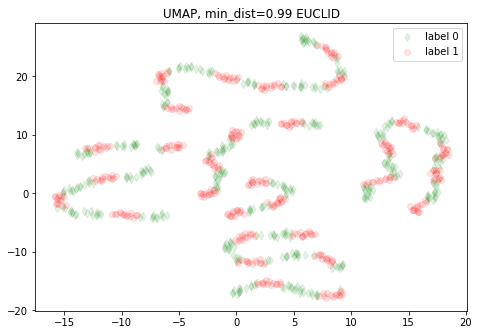

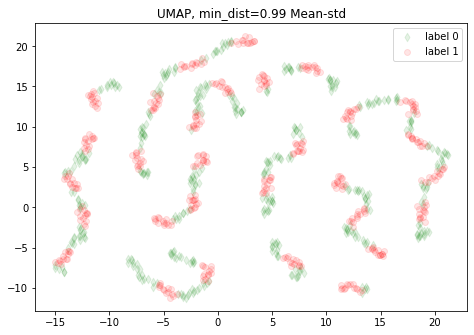

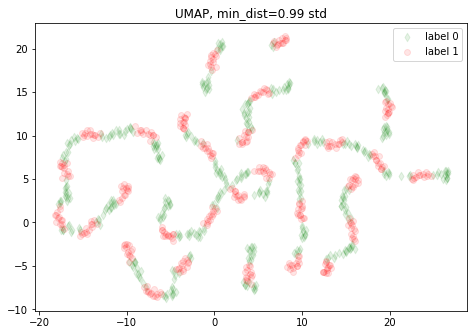

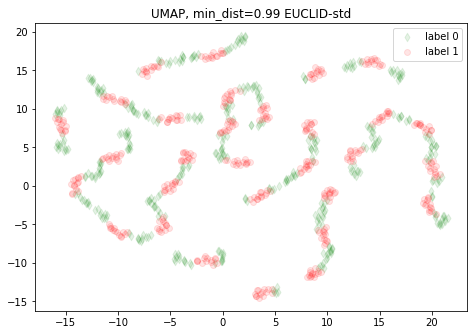

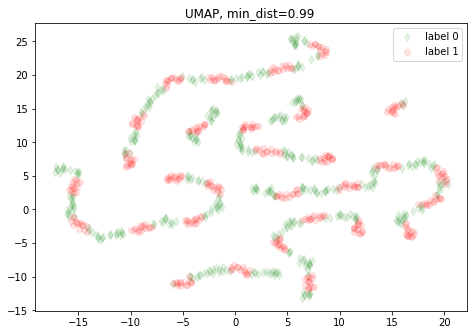

In [5]:
model = umap.UMAP

dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
min_dists = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

for min_dist in min_dists:
    params = {
        'n_components': 2,
        'min_dist': min_dist,
    }
    savefig = 'figures/HorData/UMAP/min_dist/min_dist_'+str(int(100*min_dist))+'e-2_'
    title = 'UMAP, min_dist='+ str(min_dist)
    plot_proj_notraining(X_shuffle, y_shuffle, model, params, dimred_normmode, title, savefig)

## 6.3 Layer-labeled horizontal data
Label the horizontal data by label as well, i.e. each row has an AMD label (0 for control, 1 for AMD patient) and has a layer label (1, 2, 3, 4, 5).

In [5]:
# X_OCT: (W, N x patients x H) 
# y_labels: 1 if AMD, 0 if control.
# y_layer: 1, 2, 3, 4, 5 depending on the layer.
y_layer = np.zeros((14*18*X.shape[1]))

# true labels are for the third patient
# each patient has 14 OCT scans
# each scan has 5 rows.
for i in range(0, 5):
    y_layer[i::5] = i+1

# y[:, 0]: y_labels
# y[:, 1]: y_layer
y = np.vstack((y_labels, y_layer)).T
print(y.shape)


# shuffle the indices
X_shuffle, y_shuffle = shuffle(X_OCT, y, random_state=0)

(1260, 2)


define the masks with respect to labels regarding layers

In [6]:
mask = (np.zeros((5, y_shuffle.shape[0]))).astype(bool)
for j in range(5):
    mask[j] = (y_shuffle[:, 1] == j+1).astype(bool)


In [7]:
# for example we see that the mask[4] is the mask related to the 5th layer.
y_shuffle[mask[4],1]

array([5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5., 5.,
       5., 5., 5., 5., 5.

### 6.3.1. TSNE with layer labels

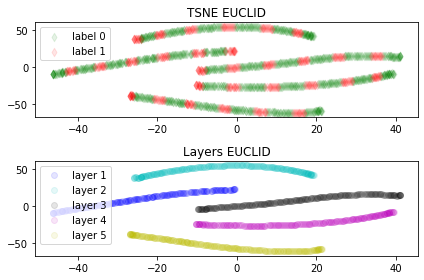

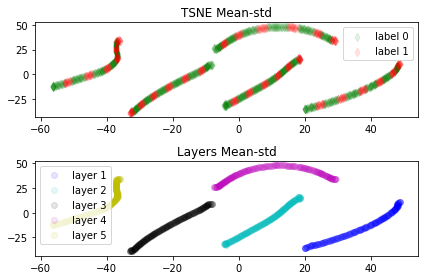

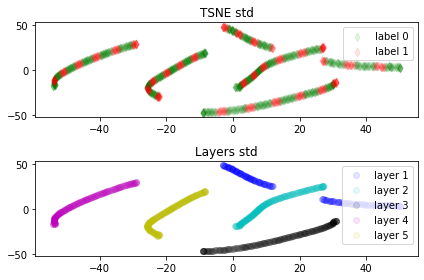

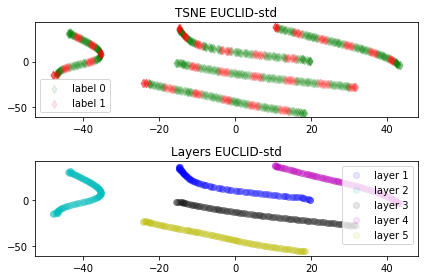

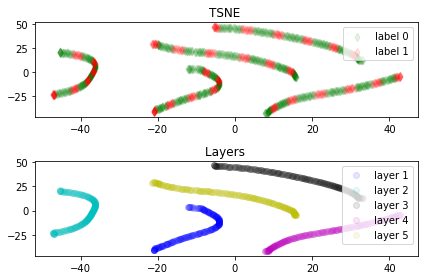

In [54]:
model = TSNE
params = {
    'n_components': 2,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle[:, 0]).astype(bool)
mask1 = np.array(y_shuffle[:, 0]).astype(bool)
dimred_model = model(**params)
colors = ['b', 'c', 'k', 'm', 'y']


for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig, ax = plt.subplots(2)
    ax[0].scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax[0].scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='d', alpha=alpha, label='label 1')
    ax[0].legend()
    ax[0].set_title('TSNE '+ normmode)

    for i in range(5):
        ax[1].scatter(X_t[mask[i],0], X_t[mask[i],1], c=colors[i], marker='o', alpha=alpha, label='layer '+str(i+1))
    ax[1].legend()
    ax[1].set_title('Layers '+ normmode)

    fig.tight_layout()
    fig.savefig('figures/HorData/layer_labeled/TSNE_'+savefile_normmode[j], bbox_inches='tight')

### 6.3.2 UMAP with layer labels

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


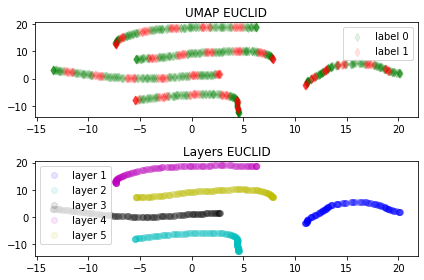

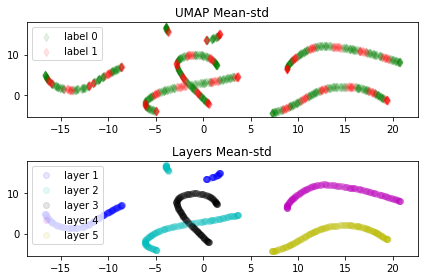

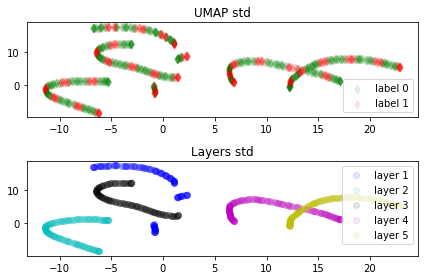

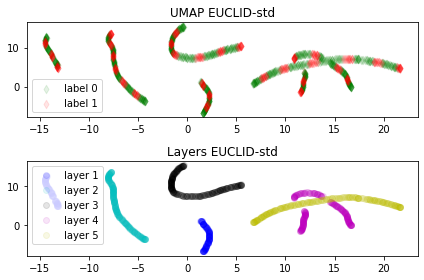

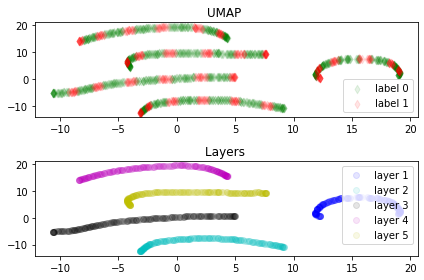

In [9]:
model = umap.UMAP
params = {
    'n_components': 2,
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y_shuffle[:, 0]).astype(bool)
mask1 = np.array(y_shuffle[:, 0]).astype(bool)
dimred_model = model(**params)
colors = ['b', 'c', 'k', 'm', 'y']

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X_shuffle, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig, ax = plt.subplots(2)
    ax[0].scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax[0].scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='d', alpha=alpha, label='label 1')
    ax[0].legend()
    ax[0].set_title('UMAP '+ normmode)

    for i in range(5):
        ax[1].scatter(X_t[mask[i],0], X_t[mask[i],1], c=colors[i], marker='o', alpha=alpha, label='layer '+str(i+1))
    ax[1].legend()
    ax[1].set_title('Layers '+ normmode)

    fig.tight_layout()
    fig.savefig('figures/HorData/layer_labeled/UMAP_'+savefile_normmode[j], bbox_inches='tight')

## 6.4 Dim. Red. on single layers
We apply dimensionality reduction models (TSNE and UMAP) on single layers.   

We have the same variables `X_shuffle` and `y_shuffle` as in Section 6.3. 

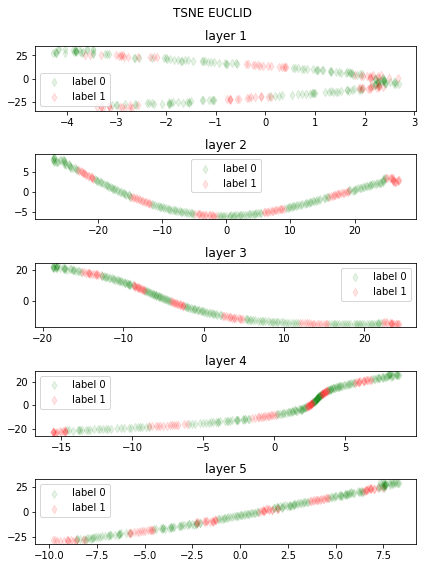

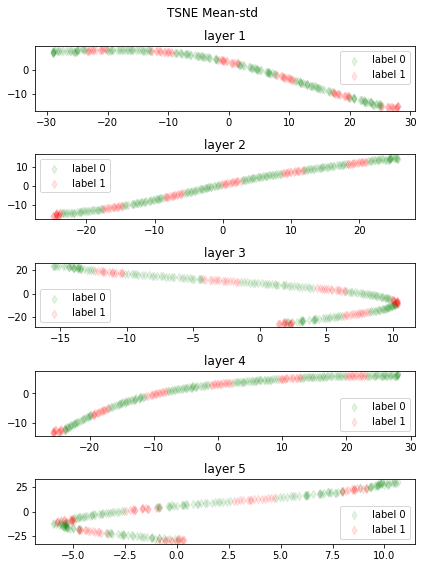

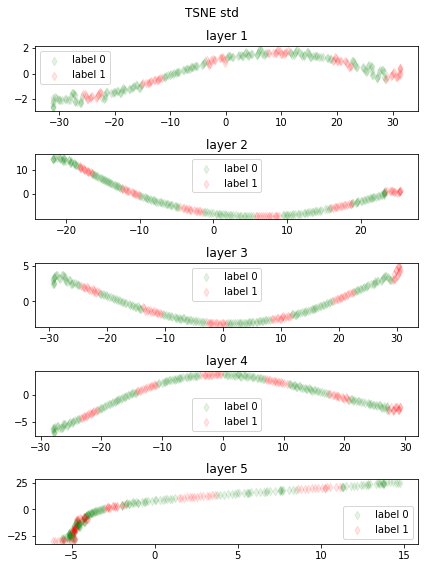

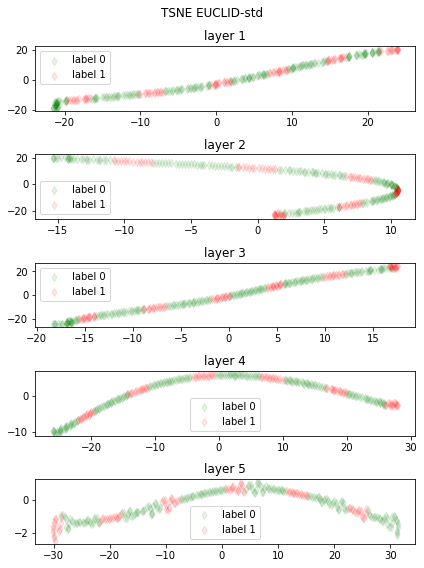

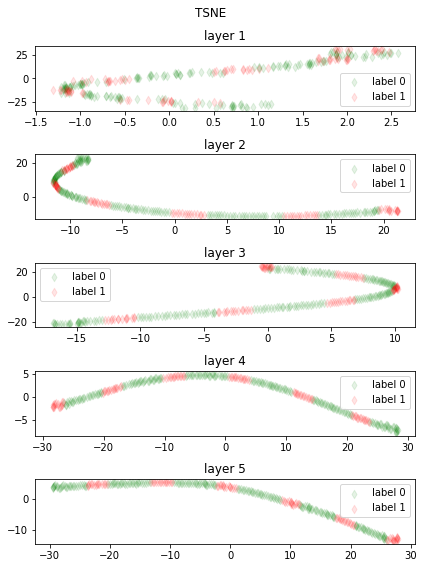

In [22]:
model = TSNE
params = {
    'n_components': 2,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
suptitle = 'TSNE '
savefig = 'figures/HorData/per_layer/TSNE_'

plot_per_layer(X_shuffle, y_shuffle, mask, model, params, dimred_normmode, suptitle, savefig)

## 6.4.1 TSNE on single layers

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


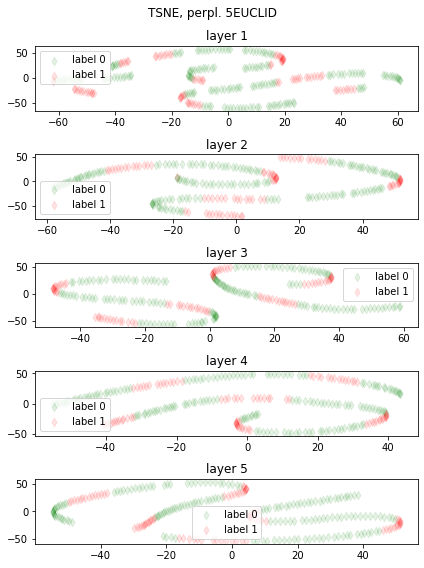

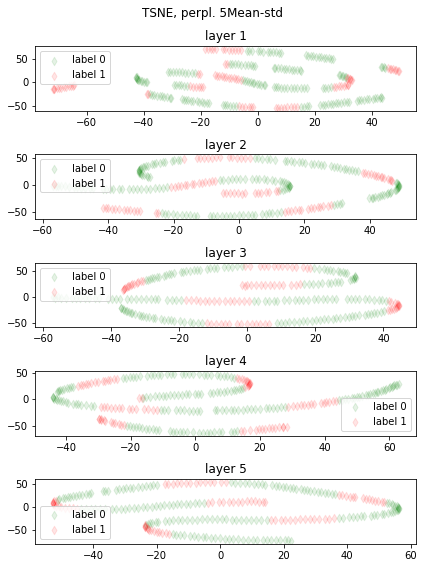

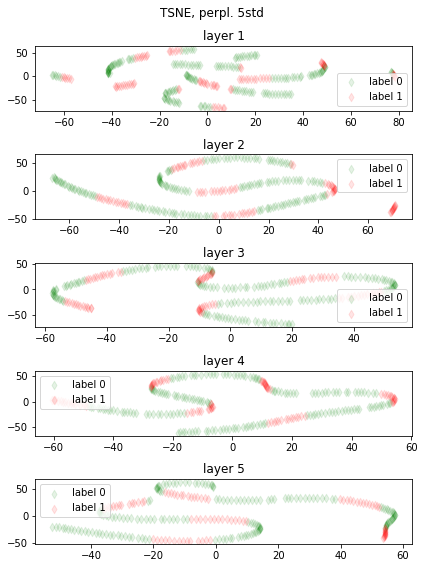

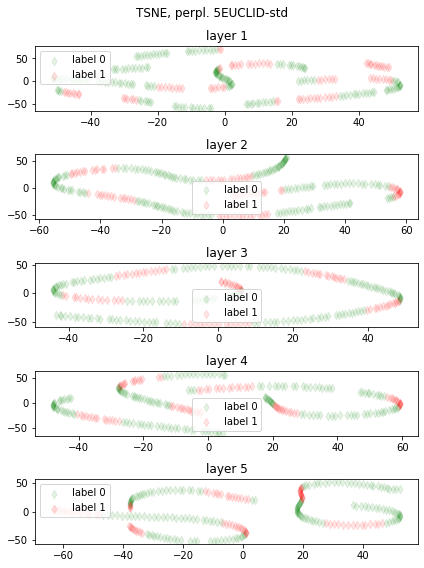

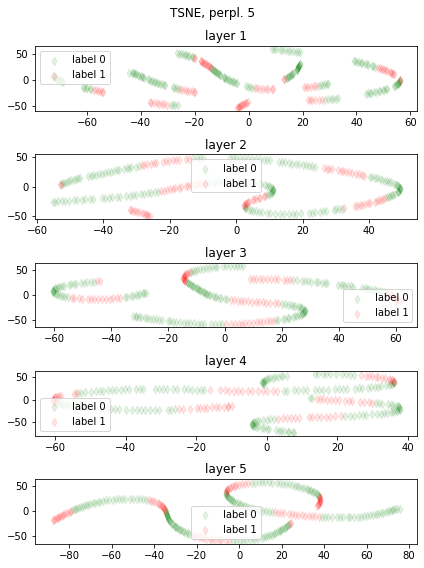

...

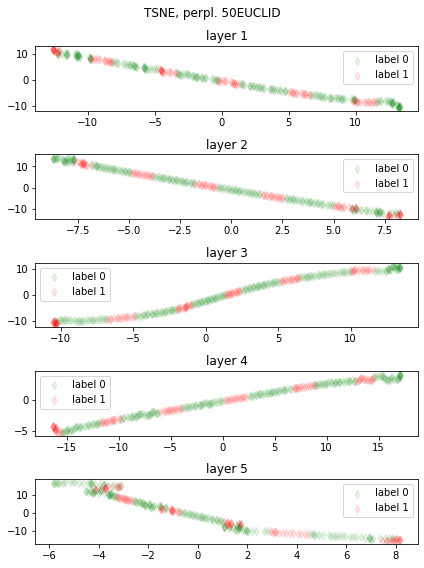

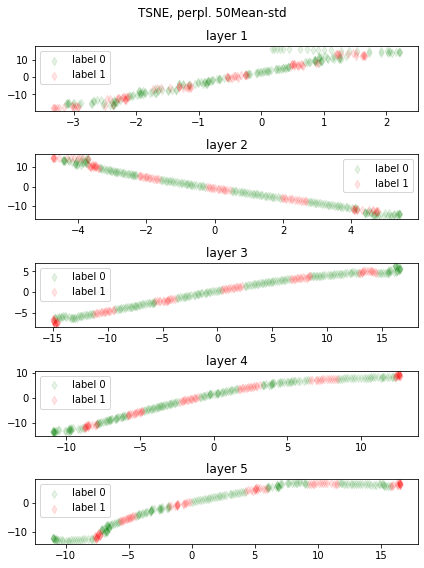

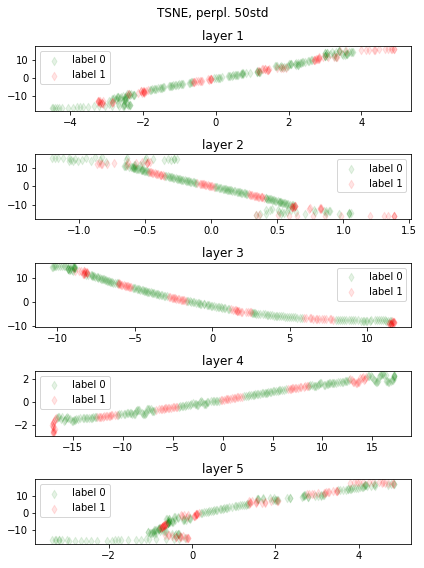

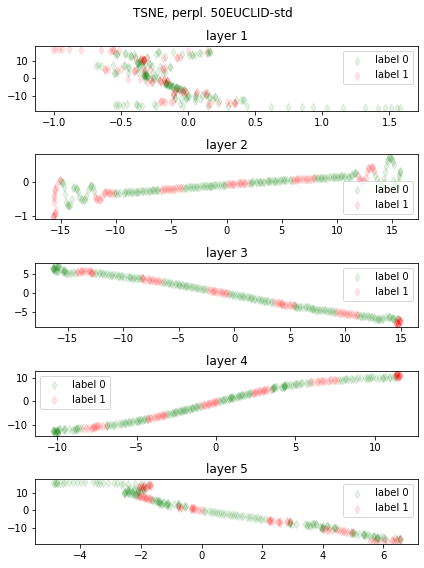

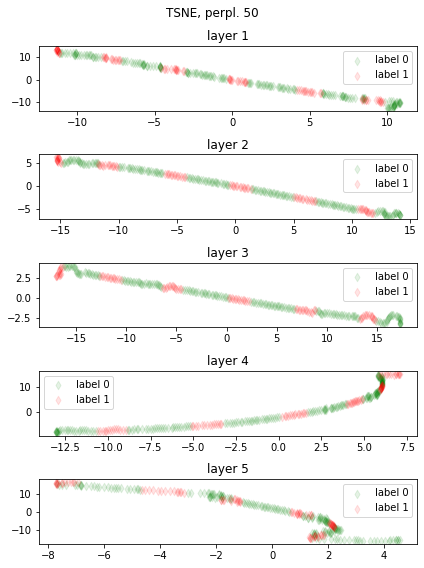

In [23]:
model = TSNE
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
perplexities = np.arange(start=5, stop=55, step=5)

for perplexity in perplexities:
    params = {
        'n_components': 2,
        'learning_rate': 'auto',
        'init': 'random',
        'perplexity': perplexity,
    }
    savefig = 'figures/HorData/per_layer/TSNE/perplexity_'+str(perplexity)
    suptitle = 'TSNE, perpl. '+ str(perplexity)
    plot_per_layer(X_shuffle, y_shuffle, mask, model, params, dimred_normmode, suptitle, savefig)

### 6.4.2 UMAP on single layers

c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\sklearn\manifold\_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Grap

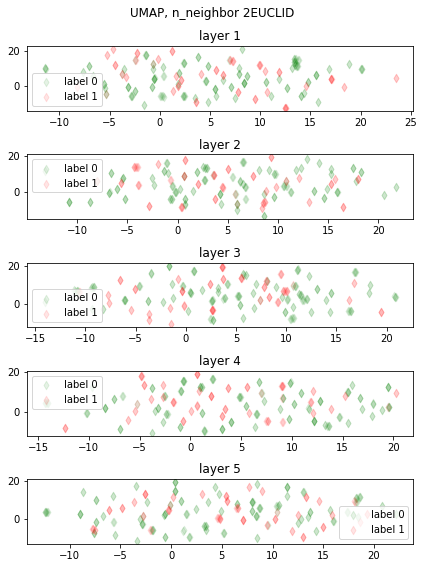

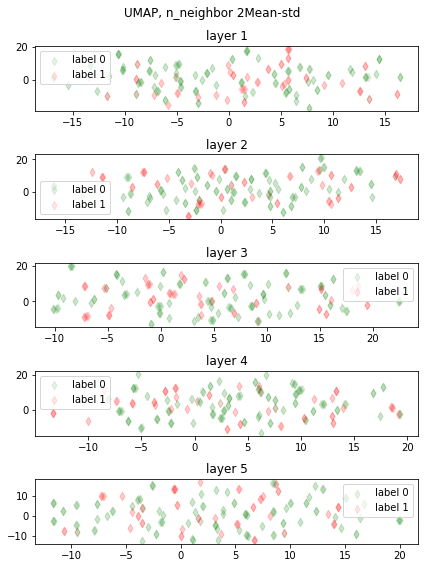

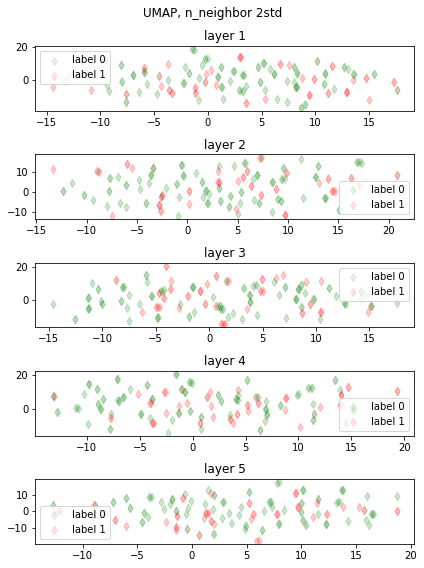

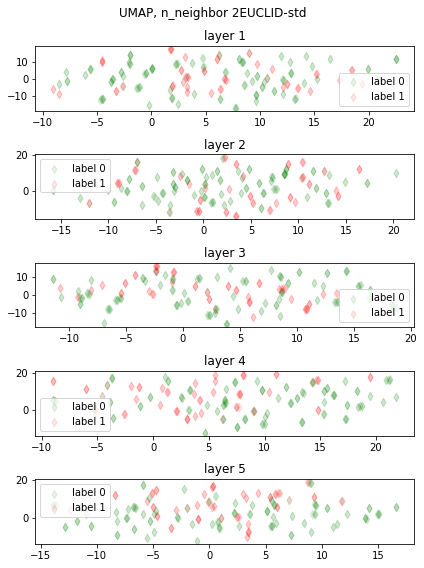

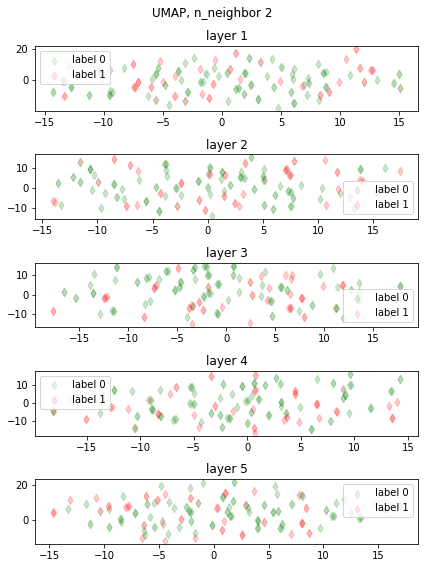

...

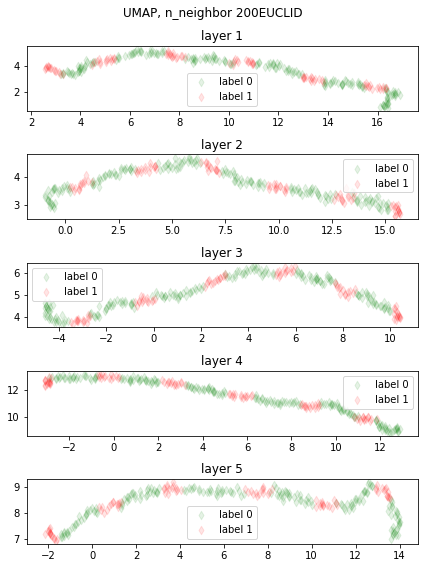

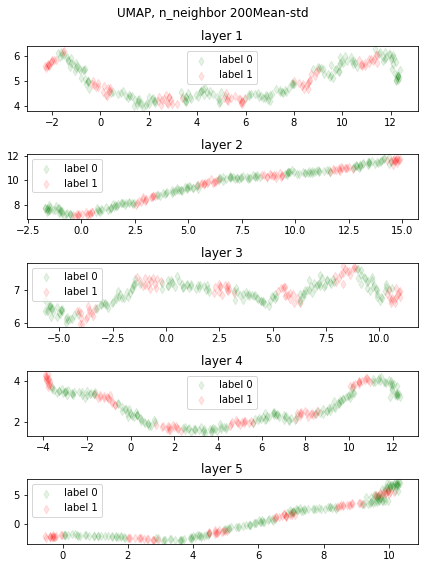

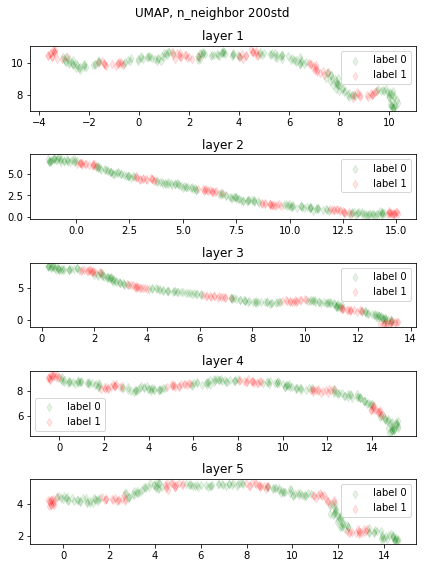

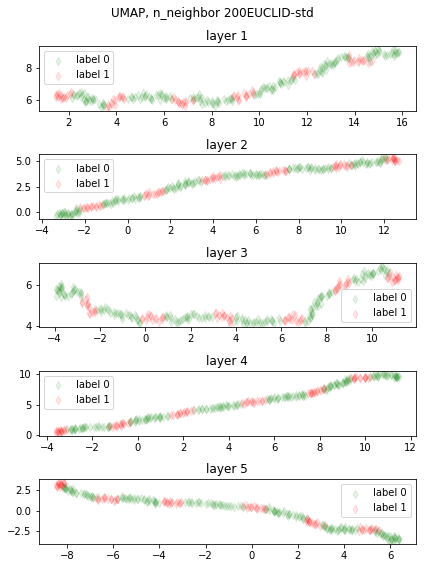

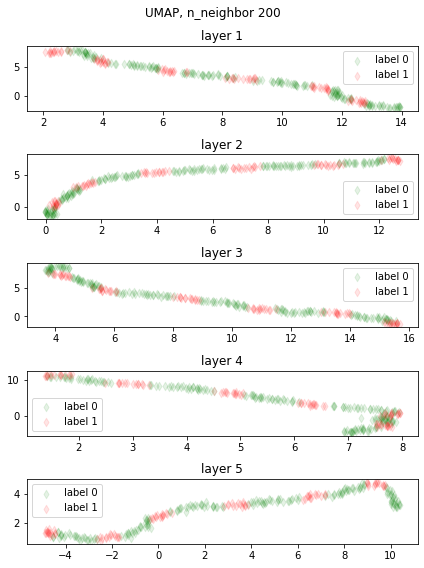

In [8]:
model = umap.UMAP
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
neighbors = [2, 5, 10, 20, 50, 100, 200]

for n_neighbor in neighbors:
    params = {
        'n_components': 2,
        'n_neighbors': n_neighbor,
    }
    savefig = 'figures/HorData/per_layer/UMAP/n_neighbor_'+ str(n_neighbor)
    suptitle = 'UMAP, n_neighbor '+ str(n_neighbor)
    plot_per_layer(X_shuffle, y_shuffle, mask, model, params, dimred_normmode, suptitle, savefig)
    

c:\Users\line\Desktop\Mauro\5_Thickness\OCT_thickness\helpers.py:457: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(number_layers, figsize=(6,8))


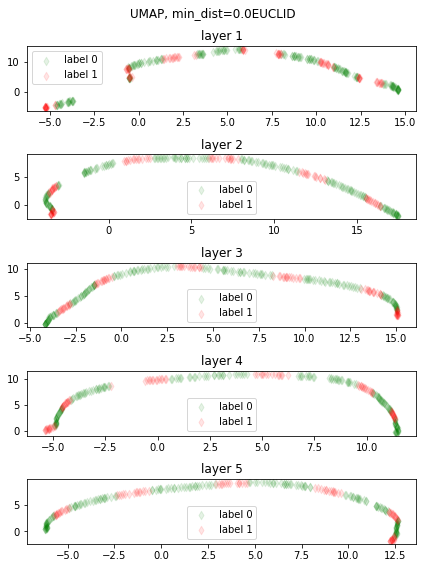

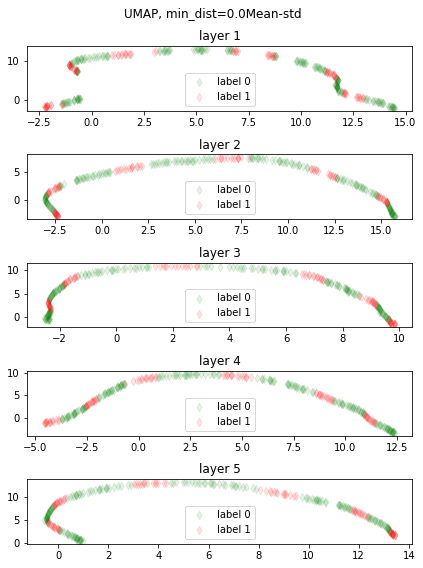

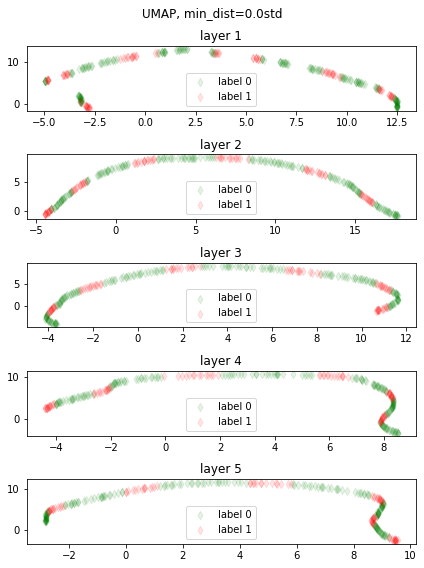

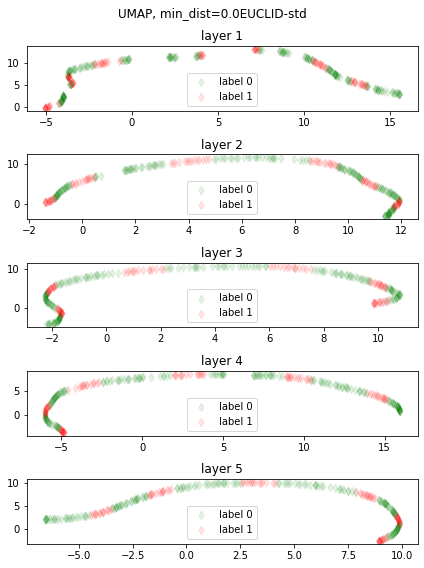

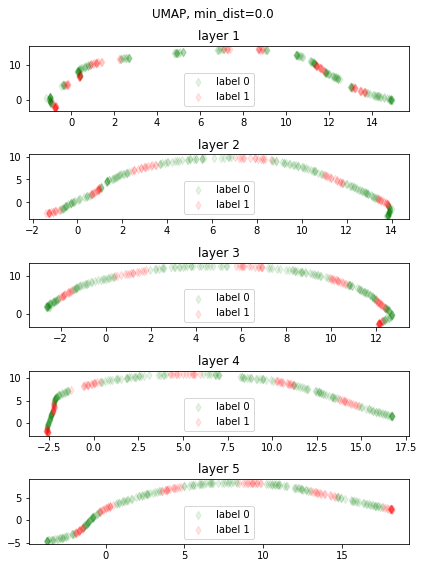

...

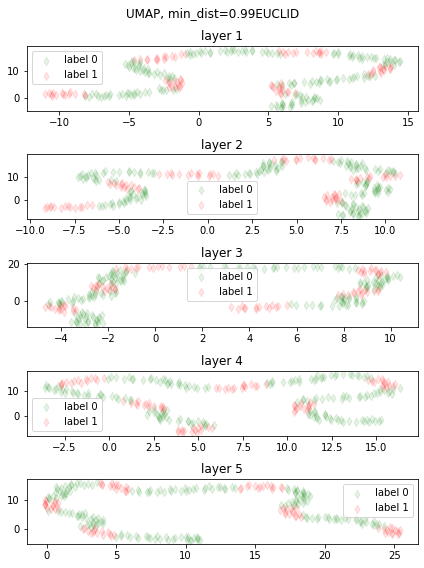

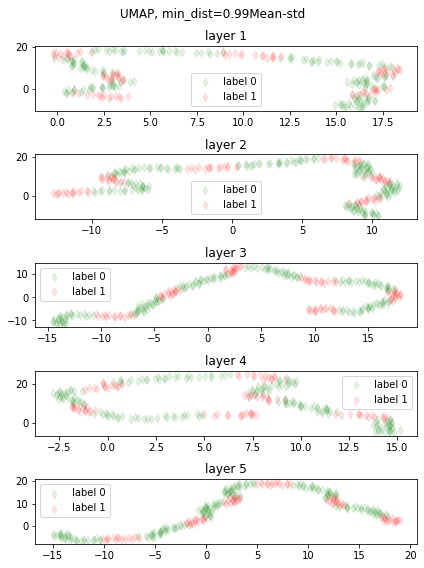

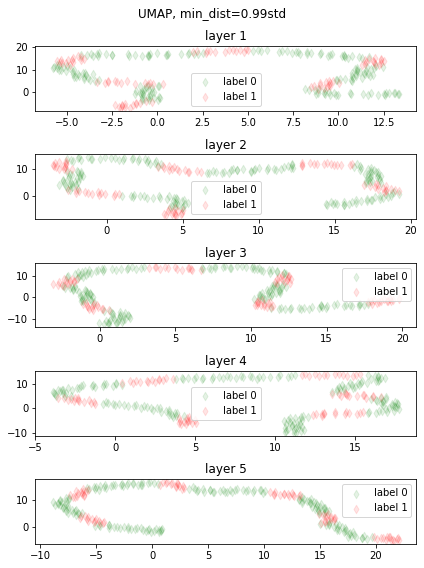

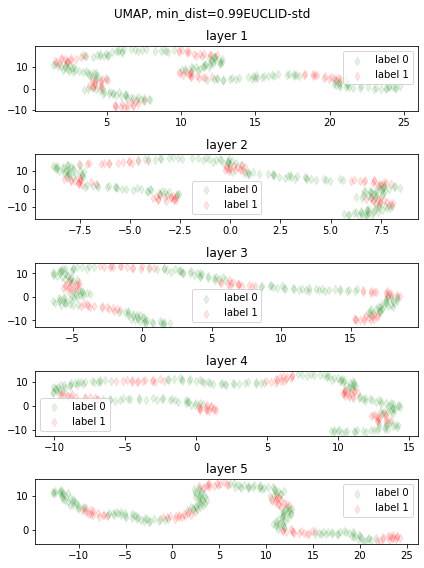

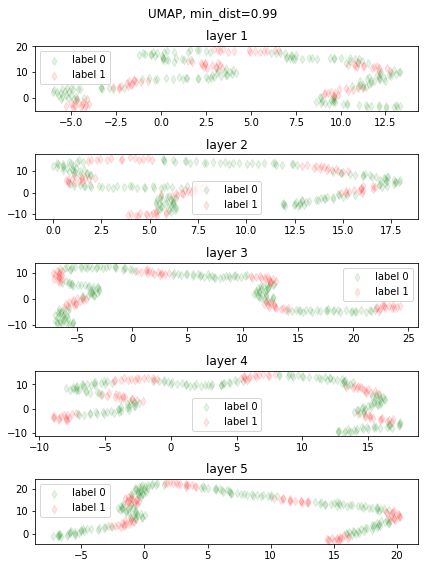

In [9]:
model = umap.UMAP
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
min_dists = [0.0, 0.1, 0.25, 0.5, 0.8, 0.99]

for min_dist in min_dists:
    params = {
        'n_components': 2,
        'min_dist': min_dist,
    }

    savefig = 'figures/HorData/per_layer/UMAP/min_dist_'+str(int(100*min_dist))+'e-2_'
    suptitle = 'UMAP, min_dist='+ str(min_dist)
    plot_per_layer(X_shuffle, y_shuffle, mask, model, params, dimred_normmode, suptitle, savefig)